### Fed Reserve PR and Speech Analysis
### Arti Patel

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras import regularizers
from tensorflow.keras.datasets import imdb
from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.preprocessing import text
import sklearn.model_selection as sk
from datetime import datetime
from datetime import timedelta
import re

In [ ]:
#packages for webscraping
from frb_functions_pr import *
import pandas as pd
from copy import deepcopy

#### Webscrape Data - takes long time to webscrape -- importing saved csv files instead is recommended

In [ ]:
#speeches
speech_urls = navigate_frb_speeches()
speeches = get_frb_speech_text(speech_urls)
speeches_df = pd.DataFrame(speeches,columns=['url', 'speech_date', 'title', 'speaker', 'location', 'full_text'])
df = clean_speech_text(speeches_df)
df.to_csv('speeches.csv',index=False)

#archived speeches:
archived_speech_urls = navigate_frb_archived_speeches()
archived_speeches = get_frb_speech_text_archived(archived_speech_urls[0])
archived_s = pd.DataFrame(list(zip(archived_speech_urls[0],archived_speech_urls[1],archived_speech_urls[2],archived_speech_urls[3],archived_speech_urls[4],archived_speeches)),columns = ['url','speaker','location','date','title','content'])
archived_s.to_csv('archived_speeches.csv',index=False)

In [ ]:
#press releases:
pr_urls = navigate_fomc_speeches()
pr = get_fomc_speech_text(pr_urls)
pr_df = pd.DataFrame(pr, columns=['url', 'article_time', 'title', 'pr', 'releaseTime'])
pr_df.to_csv('press_releases.csv',index=False)

#archived press releases
pr_archived_urls = navigate_fomc_archived_speeches()
pr = get_fomc_text_archived(pr_archived_urls[0])
pr_archived = pd.DataFrame(list(zip(pr_archived_urls[0], pr_archived_urls[1],pr[0],pr[1])), columns =['url', 'title','content','date'])
pr_archived.to_csv('pr_archived.csv',index=False)

### Preprocessing

In [ ]:
speeches= pd.read_csv('speeches.csv')
pr = pd.read_csv('press_releases.csv')
archived_speeches = pd.read_csv('archived_speeches.csv')
pr_archived = pd.read_csv('pr_archived.csv')

In [ ]:
#Taking out names/irrelevant repetitive info
for i in range(len(pr_archived['content'])):
    start = pr_archived['content'][i].find("Voting for the FOMC monetary policy action were: ")
    end = pr_archived['content'][i].find("In a related action, ")+len("In a related action, ")
    substring = pr_archived['content'][i][start:end]
    pr_archived['content'][i] = pr_archived['content'][i].replace(substring, "")

In [ ]:
#standardizing date forms
new = []
for i in pr_archived.index:
    new.append(datetime.strptime(str(pr_archived['date'][i]).lower().replace(",",""), "%B %d %Y").strftime("%Y-%m-%d"))
pr_archived['date'] = new
#pr_archived.head()

new = []
for i in archived_speeches.index:
    new.append(datetime.strptime(str(archived_speeches['date'][i]).lower().replace(",",""), "%B %d %Y").strftime("%Y-%m-%d"))
archived_speeches['date'] = new
#archived_speeches.head()

new = []
for i in mp_speeches.index:
    new.append(datetime.strptime(str(mp_speeches['speech_date'][i]).lower().replace(",",""), "%B %d %Y").strftime("%Y-%m-%d"))
mp_speeches['speech_date'] = new

new = []
for i in pr.index:
    new.append(datetime.strptime(str(pr['article_time'][i]).lower().replace(",",""), "%d-%b-%y").strftime("%Y-%m-%d"))
pr['article_time'] = new

In [ ]:
#filtering speeches and archived speeches for those only related to monetary policy
#filter speeches for only monetary policy relates o
mp = []
for i in range(len(archived_speeches)):
    if 'Monetary Policy' in archived_speeches['title'][i] or 'monetary policy' in archived_speeches['title'][i] or 'Monetary policy' in archived_speeches['title'][i] or 'monetary Policy' in archived_speeches['title'][i]:
        mp.append(archived_speeches['title'][i])
archived_mp_speeches = archived_speeches[archived_speeches['title'].isin(mp)]
#len(archived_mp_speeches)

#filter speeches for only monetary policy relates o
mp = []
for i in range(len(speeches)):
    if 'Monetary Policy' in speeches['title'][i] or 'monetary policy' in speeches['title'][i] or 'Monetary policy' in speeches['title'][i] or 'monetary Policy' in speeches['title'][i]:
        mp.append(speeches['title'][i])
mp_speeches = speeches[speeches['title'].isin(mp)]

In [ ]:
#import VIX data
vix = pd.read_csv('VIX.csv')
vix['Date'] = [datetime.strptime(str(vix['Date'][i]), "%Y-%m-%d") for i in range(len(vix['Date']))]
vix['vol'] = [1 if vix['Close'][i]>25 else 0 for i in range(len(vix['Close']))]
#vix.head()

In [ ]:
#standardizing all columns in order to combine all text data
pr.columns = ['url','Date','title','content','time']
mp_speeches.columns = ['url','Date','title','speaker','location','content']
archived_mp_speeches.columns = ['url','speaker','location','Date','title','content']
pr_archived.columns = ['url','title','content','Date']

pr = pr[['url','Date','title','content']]
mp_speeches = mp_speeches[['url','Date','title','content']]
archived_mp_speeches = archived_mp_speeches[['url','Date','title','content']]
pr_archived = pr_archived[['url','Date','title','content']]

text = pd.concat([pr,mp_speeches,archived_mp_speeches,pr_archived],ignore_index=True)
text.shape

In [ ]:
text['Date'] = [datetime.strptime(str(text['Date'][i]), "%Y-%m-%d") for i in range(len(text['Date']))]

In [ ]:
def to_week_day(date):
    if date.isoweekday() in set((6, 7)):
        date += timedelta(days=-date.isoweekday() + 8)
    return date
text['altdates'] = [to_week_day(text['Date'][i]) for i in range(len(text['Date']))]

In [ ]:
#merge text data with VIX data
df = pd.merge(left=text, right=vix, how='left', left_on='altdates', right_on='Date')
df.to_csv('data2.csv',index=False)

### Model Building

In [2]:
df = pd.read_csv('data2.csv')
df.head()

,url,Date_x,title,content,altdates,Date_y,Open,High,Low,Close,Adj Close,Volume,vol
0,https://www.federalreserve.gov/newsevents/pres...,2020-06-10,Federal Reserve issues FOMC statement,The Federal Reserve is committed to using its ...,2020-06-10,2020-06-10,26.730000,29.010000,26.059999,27.570000,27.570000,0,1
1,https://www.federalreserve.gov/newsevents/pres...,2020-04-29,Federal Reserve issues FOMC statement,The Federal Reserve is committed to using its ...,2020-04-29,2020-04-29,32.480000,33.189999,30.709999,31.230000,31.230000,0,1
2,https://www.federalreserve.gov/newsevents/pres...,2020-03-23,Federal Reserve issues FOMC statement,The Federal Reserve is committed to use its fu...,2020-03-23,2020-03-23,74.080002,76.739998,60.459999,61.590000,61.590000,0,1
3,https://www.federalreserve.gov/newsevents/pres...,2020-03-15,Federal Reserve issues FOMC statement,The coronavirus outbreak has harmed communitie...,2020-03-16,2020-03-16,57.830002,83.559998,57.830002,82.690002,82.690002,0,1
4,https://www.federalreserve.gov/newsevents/pres...,2020-03-03,Federal Reserve issues FOMC statement,The fundamentals of the U.S. economy remain st...,2020-03-03,2020-03-03,33.650002,41.060001,24.930000,36.820000,36.820000,0,1


In [3]:
#recession dates:
#march-nov 2001
#dec 2007-june 2009
#feb 2020-present

In [4]:
recession_dates = []
for i in range(len(df['altdates'])):
    if (df['altdates'][i] >= "2001-03-01" and df['altdates'][i]<= "2001-11-30") or (df['altdates'][i] >= "2007-12-01" and df['altdates'][i]<= "2009-06-30") or (df['altdates'][i] >= "2020-02-01" and df['altdates'][i]<= "2020-8-31"):
        recession_dates.append(1)
    else:
        recession_dates.append(0)

In [5]:
df['recession'] = recession_dates

In [6]:
df = df[['url','title','altdates','content','Close','vol','recession']]

In [7]:
df['content'] = [df['content'][i].replace('\n',' ') for i in range(len(df['content']))]

In [8]:
cut = []
for i in range(len(df['content'])):
    if 'Voting for the monetary policy' in df['content'][i]:
        cut.append(df['content'][i].split('Voting for the monetary policy')[0])
    elif 'Voting for the FOMC monetary policy' in df['content'][i]:
        cut.append(df['content'][i].split('Voting for the FOMC monetary policy')[0])
    else:
        cut.append(df['content'][i])

In [9]:
df['content'] = cut

In [10]:
#two choices for labels: VIX data or recession dates, comment out whichever not needed

content = [i for i in df['content']]
labels = [i for i in df['vol']]
#labels = [i for i in df['recession']]
urls = [i for i in df['url']]

In [11]:
df.shape

(391, 7)

In [62]:
stopwords = ["For","As","This","In","A","I","The","a", "about", "above", "after", "again", "against", "all", "am", "an", "and", "any", "are", "as", "at", "be", "because", "been", "before", "being", "below", "between", "both", "but", "by", "could", "did", "do", "does", "doing", "down", "during", "each", "few", "for", "from", "further", "had", "has", "have", "having", "he", "he'd", "he'll", "he's", "her", "here", "here's", "hers", "herself", "him", "himself", "his", "how", "how's", "i", "i'd", "i'll", "i'm", "i've", "if", "in", "into", "is", "it", "it's", "its", "itself", "let's", "me", "more", "most", "my", "myself", "nor", "of", "on", "once", "only", "or", "other", "ought", "our", "ours", "ourselves", "out", "over", "own", "same", "she", "she'd", "she'll", "she's", "should", "so", "some", "such", "than", "that", "that's", "the", "their", "theirs", "them", "themselves", "then", "there", "there's", "these", "they", "they'd", "they'll", "they're", "they've", "this", "those", "through", "to", "too", "under", "until", "up", "very", "was", "we", "we'd", "we'll", "we're", "we've", "were", "what", "what's", "when", "when's", "where", "where's", "which", "while", "who", "who's", "whom", "why", "why's", "with", "would", "you", "you'd", "you'll", "you're", "you've", "your", "yours", "yourself", "yourselves"]

In [63]:
nostop_sentences = []
for i in range(len(content)):
    sentence = content[i].replace(',','').replace(':','').replace('.','').replace(')','').replace('(','').replace('[','').replace(']','').replace('?','').replace('!','')
    for word in stopwords:
        token = " " + word + " "
        sentence = sentence.replace(token, " ")
        sentence = sentence.replace("  ", " ")
    nostop_sentences.append(sentence)

In [64]:
## comment out if leaving stop words in *****

content = nostop_sentences

In [12]:
#proportion of pos-neg --- imbalanced data***
print("Proportion of high vol: " + str(round(sum(df['vol'])/df.shape[0],2)))
print("Proportion of recessionary dates: "+str(round(sum(df['recession']/df.shape[0]),2)))

Proportion of high vol: 0.19
Proportion of recessionary dates: 0.13


In [13]:
# break up content by splitting every 150 while retaining respective urls and labels
#this artificially creates more data and also saves memory when running model

extended_urls = []
extended_content = []
extended_labels = []

k=0
for i in content:
    sent = i.split(' ')
    for j in range(0,len(sent),150):
        extended_content.append(sent[j:j+150])
        extended_labels.append(labels[k])
        extended_urls.append(urls[k])
    k=k+1

In [14]:
s = pd.DataFrame(list(zip(extended_urls, extended_content,extended_labels)), columns =['url', 'content','label'])
s.shape

(6758, 3)

In [15]:
# drop content fewer than 50 words

small = []
for i in range(len(s)):
    if len(s['content'][i])<50:
        small.append(i)
        
s = s.drop(small)
s.shape

(6629, 3)

In [16]:
extended_urls = s['url']
extended_content = s['content']
extended_labels = s['label']

In [17]:
#l = [[i] for i in extended_labels]
labels = np.array(extended_labels)
labels

array([1, 1, 1, ..., 0, 0, 0])

In [19]:
#splitting data train/val 80/20
train_data, test_data, train_labels, test_labels = sk.train_test_split(extended_content,labels,test_size=0.2, random_state = 10)

In [20]:
#each word vector will be 16 dimensions
#only use top 15k most frequent words
#truncate after 120 words
vocab_size = 15000
embedding_dim = 16
max_length = 120
trunc_type='post'
oov_tok = "<OOV>"

In [21]:
tokenizer = text.Tokenizer(num_words = vocab_size, oov_token=oov_tok)
tokenizer.fit_on_texts(train_data)


In [22]:
word_index = tokenizer.word_index
sequences = tokenizer.texts_to_sequences(train_data)
padded = sequence.pad_sequences(sequences,maxlen=max_length, truncating=trunc_type)

testing_sequences = tokenizer.texts_to_sequences(test_data)
testing_padded = sequence.pad_sequences(testing_sequences,maxlen=max_length)

In [23]:
#function to retrieve words from tokens
reverse_word_index = dict([(value, key) for (key, value) in word_index.items()])

def decode_review(text):
    return ' '.join([reverse_word_index.get(i, '?') for i in text])

print(decode_review(padded[3]))
print(train_data[train_data.index[3]])

san francisco june     for a discussion of the possible role played by these factors in explaining the current low level of interest rates in the united states and other advanced economies see lawrence h summers  us economic prospects secular stagnation hysteresis and the zero lower bound business economics vol  april pp   robert j gordon  the demise of us economic growth restatement rebuttal and reflections  nber working paper  cambridge mass national bureau of economic research february and ben s bernanke  why are interest rates so low part  secular stagnation  ben bernankes blog blog post washington brookings institution march    for example see james d hamilton
['San', 'Francisco', 'June', '', '', '', '', 'For', 'a', 'discussion', 'of', 'the', 'possible', 'role', 'played', 'by', 'these', 'factors', 'in', 'explaining', 'the', 'current', 'low', 'level', 'of', 'interest', 'rates', 'in', 'the', 'United', 'States', 'and', 'other', 'advanced', 'economies', 'see', 'Lawrence', 'H', 'Summer

In [24]:
model_one = models.Sequential([
    layers.Embedding(vocab_size, embedding_dim, input_length=max_length),
    layers.Flatten(),
    layers.Dense(6, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])
model_one.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])
model_one.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 120, 16)           240000    
_________________________________________________________________
flatten (Flatten)            (None, 1920)              0         
_________________________________________________________________
dense (Dense)                (None, 6)                 11526     
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 7         
Total params: 251,533
Trainable params: 251,533
Non-trainable params: 0
_________________________________________________________________


In [25]:
num_epochs = 15
model_one_history = model_one.fit(padded, train_labels, epochs=num_epochs, validation_data=(testing_padded, test_labels))

Epoch 1/15
166/166 [==============================] - 0s 3ms/step - loss: 0.4913 - accuracy: 0.8131 - val_loss: 0.3975 - val_accuracy: 0.8281
Epoch 2/15
166/166 [==============================] - 0s 2ms/step - loss: 0.3084 - accuracy: 0.8512 - val_loss: 0.3071 - val_accuracy: 0.8635
Epoch 3/15
166/166 [==============================] - 0s 2ms/step - loss: 0.1275 - accuracy: 0.9662 - val_loss: 0.2623 - val_accuracy: 0.8997
Epoch 4/15
166/166 [==============================] - 0s 2ms/step - loss: 0.0313 - accuracy: 0.9955 - val_loss: 0.3056 - val_accuracy: 0.8854
Epoch 5/15
166/166 [==============================] - 0s 2ms/step - loss: 0.0094 - accuracy: 0.9998 - val_loss: 0.2992 - val_accuracy: 0.8974
Epoch 6/15
166/166 [==============================] - 0s 2ms/step - loss: 0.0046 - accuracy: 0.9998 - val_loss: 0.3058 - val_accuracy: 0.8997
Epoch 7/15
166/166 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000 - val_loss: 0.3253 - val_accuracy: 0.8982
Epoch 

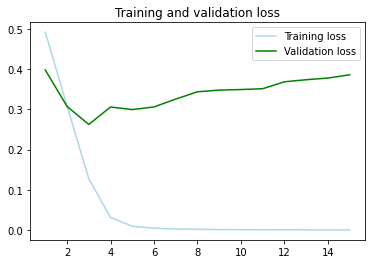

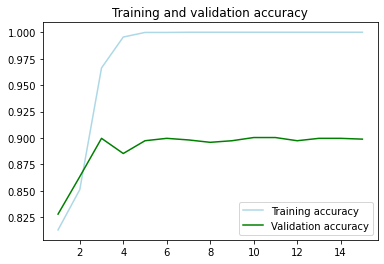

In [26]:
accuracy = model_one_history.history['accuracy']
val_accuracy = model_one_history.history['val_accuracy']
loss = model_one_history.history['loss']
val_loss = model_one_history.history['val_loss']

epochs = range(1, len(accuracy) + 1)

plt.plot(epochs, loss, 'lightblue', label='Training loss')
plt.plot(epochs, val_loss, 'green', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.figure()

plt.plot(epochs, accuracy, 'lightblue', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'green', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.show()

In [27]:
e = model_one.layers[0]
weights = e.get_weights()[0]
print(weights.shape) # shape: (vocab_size, embedding_dim)

(15000, 16)


In [28]:
#export word embeddings to plot in tensorflow projector
import io

out_v = io.open('nostop_vecs.tsv', 'w', encoding='utf-8')
out_m = io.open('no_stop_meta.tsv', 'w', encoding='utf-8')
out_m.write("Words" + "\n")
#out_v.write("Word Embeddings" + "\n")
for word_num in range(1, vocab_size):
    word = reverse_word_index[word_num]
    embeddings = weights[word_num]
    out_m.write(word + "\n")
    out_v.write('\t'.join([str(x) for x in embeddings]) + "\n")
out_v.close()
out_m.close()

In [29]:
#16 dim
weights[0]

array([ 0.00023627,  0.02741542,  0.0218123 , -0.03212263, -0.03888903,
        0.01416203, -0.00604341, -0.01288679, -0.01045762,  0.02197975,
       -0.05746841, -0.00570751,  0.01831681, -0.04995451,  0.02309633,
       -0.02740248], dtype=float32)

In [30]:
words = [reverse_word_index[i] for i in range(1,vocab_size+1)]

In [31]:
#reducing 16 dimensions to 3 using PCA
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
scaled_weights = StandardScaler().fit_transform(weights)
pca = PCA(n_components=3)
principalComponents = pca.fit_transform(scaled_weights)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2', 'principal component 3'])

In [32]:
#first three components retain 64% of variability
pca.explained_variance_ratio_

array([0.5413913 , 0.0595412 , 0.04353676], dtype=float32)

In [33]:
principalDf.shape
len(words)

15000

In [34]:
principalDf['words'] = words
principalDf.head()

,principal component 1,principal component 2,principal component 3,words
0,-0.745317,0.023982,-1.068749,<OOV>
1,0.709275,-1.994052,-0.395694,the
2,-0.220534,-1.867415,-2.621512,of
3,-1.260742,-1.002198,-0.920071,to
4,-0.830608,-1.046526,-2.280967,in


In [59]:
#linear combinations of 16 dim for each component
loadings = pd.DataFrame(pca.components_.T*np.sqrt(pca.explained_variance_ratio_))
loadings.columns = ['PC{}'.format(i) for i in loadings.columns]
#loadings.index = words
loadings

,PC0,PC1,PC2
0,-0.065444,0.239561,-0.010274
1,-0.187555,-0.017558,0.031371
2,-0.203739,-0.005484,0.013535
3,-0.201245,-0.001895,0.015169
4,-0.203109,-0.010158,0.010224
5,0.189785,0.004208,-0.020223
6,0.201143,0.010711,0.000975
7,0.188652,-0.011836,0.010510
8,0.184256,0.014299,0.014132
9,-0.171642,-0.026159,-0.077737


In [36]:
components = np.array(principalDf[['principal component 1', 'principal component 2', 'principal component 3']])

In [37]:
from sklearn import preprocessing

In [38]:
components

array([[-0.7453167 ,  0.02398153, -1.0687494 ],
       [ 0.70927536, -1.9940516 , -0.39569408],
       [-0.22053364, -1.8674146 , -2.6215117 ],
       ...,
       [ 0.29608116,  0.2891371 , -0.59613395],
       [-3.2516172 , -1.7145375 ,  0.61517453],
       [-2.6638844 ,  0.7836284 ,  1.1830704 ]], dtype=float32)

In [39]:
#normalize data
norm = preprocessing.normalize(components.T, norm='l2')

In [40]:
norm_comp = pd.DataFrame({'PC1':norm[0,:], 'PC2':norm[1,:], 'PC3':norm[2,:]})

In [41]:
norm_comp['words'] = words

In [42]:
norm_comp.head()

,PC1,PC2,PC3,words
0,-0.002068,0.000201,-0.010455,<OOV>
1,0.001968,-0.016681,-0.003871,the
2,-0.000612,-0.015622,-0.025646,of
3,-0.003498,-0.008384,-0.009001,to
4,-0.002304,-0.008755,-0.022314,in


In [43]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=2, random_state=0).fit(norm_comp[['PC1','PC2','PC3']])

In [44]:
kmeans_dim = KMeans(n_clusters=2, random_state=0).fit(weights)

In [45]:
norm_comp['cluster_labels'] = kmeans.labels_

In [46]:
len(kmeans.labels_)

15000

In [47]:
import plotly.express as px

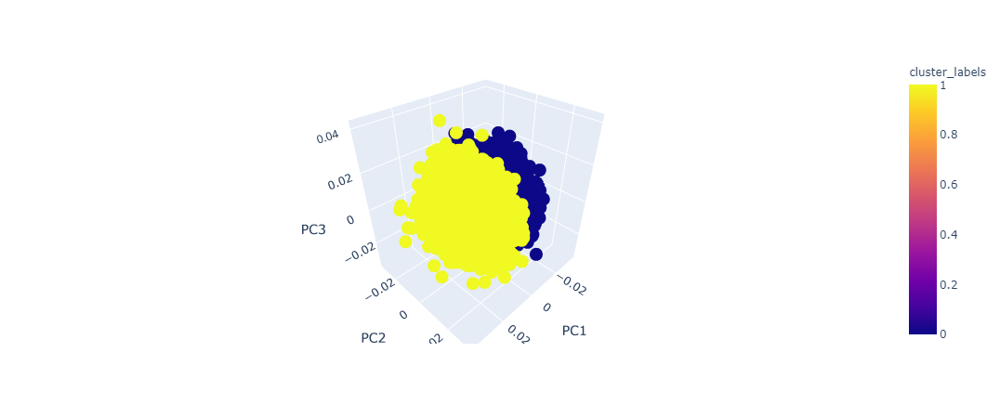

In [48]:
px.scatter_3d(norm_comp, x='PC1', y='PC2',z='PC3',hover_name='words',color='cluster_labels')

In [49]:
from sklearn.mixture import GaussianMixture
gmm = GaussianMixture(n_components=2, covariance_type='full').fit(norm_comp[['PC1','PC2','PC3']])

prediction_gmm = gmm.predict(norm_comp[['PC1','PC2','PC3']])
probs = gmm.predict_proba(norm_comp[['PC1','PC2','PC3']])


In [50]:
len(prediction_gmm)

15000

In [51]:
len(probs)

15000

In [52]:
from scipy.stats import multivariate_normal as mvn
centers = np.zeros((2,3))
for i in range(2):
    density = mvn(cov=gmm.covariances_[i], mean=gmm.means_[i]).logpdf(norm_comp[['PC1','PC2','PC3']])
    centers[i, :] = norm_comp.iloc[np.argmax(density),0:3].values


In [53]:
norm_comp['gmm'] = prediction_gmm

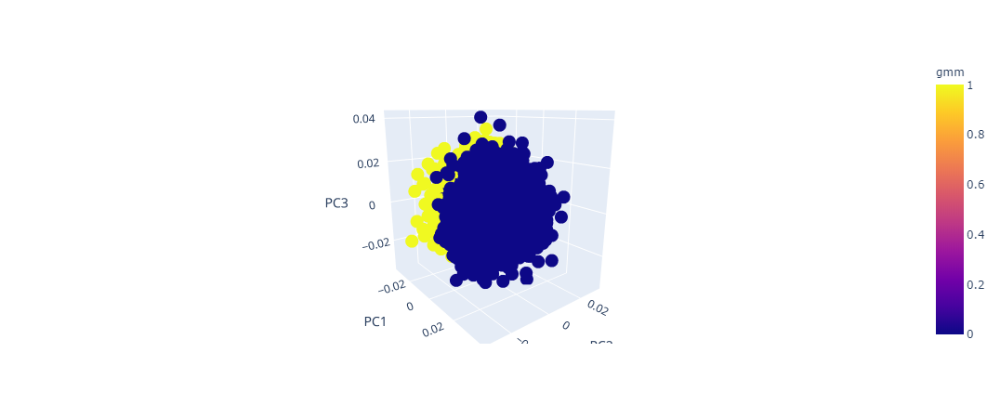

In [54]:
px.scatter_3d(norm_comp, x='PC1', y='PC2',z='PC3',hover_name='words',color='gmm')

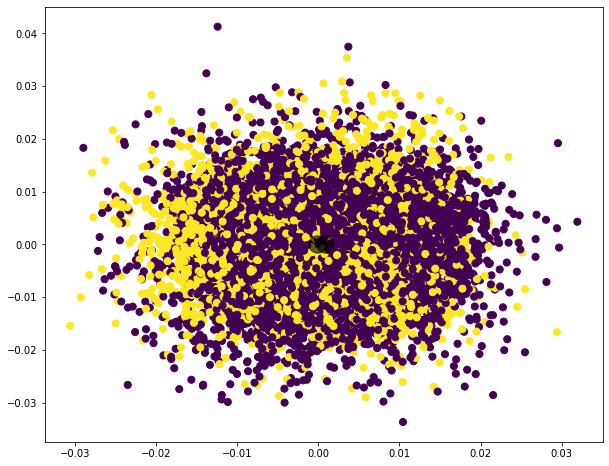

In [57]:
plt.figure(figsize = (10,8))
plt.scatter(norm_comp.iloc[:, 1], norm_comp.iloc[:, 2],c=prediction_gmm ,s=50, cmap='viridis')
plt.scatter(centers[:, 1], centers[:, 2],c='black', s=300, alpha=0.6);

In [65]:
df['nostop'] = nostop_sentences

In [66]:
df['nostop'] = [df['nostop'][i].split(' ') for i in range(len(df['nostop']))]

In [67]:
df['no_stop_tokens'] = tokenizer.texts_to_sequences(df['nostop'])

In [68]:
df.head()

,url,title,altdates,content,Close,vol,recession,nostop,no_stop_tokens
0,https://www.federalreserve.gov/newsevents/pres...,Federal Reserve issues FOMC statement,2020-06-10,The Federal Reserve is committed to using its ...,27.570000,1,1,"[The, Federal, Reserve, committed, using, full...","[2, 23, 52, 2213, 512, 239, 146, 242, 225, 107..."
1,https://www.federalreserve.gov/newsevents/pres...,Federal Reserve issues FOMC statement,2020-04-29,The Federal Reserve is committed to using its ...,31.230000,1,1,"[The, Federal, Reserve, committed, using, full...","[2, 23, 52, 2213, 512, 239, 146, 242, 225, 107..."
2,https://www.federalreserve.gov/newsevents/pres...,Federal Reserve issues FOMC statement,2020-03-23,The Federal Reserve is committed to use its fu...,61.590000,1,1,"[The, Federal, Reserve, committed, use, full, ...","[2, 23, 52, 2213, 276, 239, 146, 242, 225, 107..."
3,https://www.federalreserve.gov/newsevents/pres...,Federal Reserve issues FOMC statement,2020-03-16,The coronavirus outbreak has harmed communitie...,82.690002,1,1,"[The, coronavirus, outbreak, harmed, communiti...","[2, 3028, 5689, 1, 2125, 4002, 31, 207, 114, 3..."
4,https://www.federalreserve.gov/newsevents/pres...,Federal Reserve issues FOMC statement,2020-03-03,The fundamentals of the U.S. economy remain st...,36.820000,1,1,"[The, fundamentals, US, economy, remain, stron...","[2, 1219, 107, 46, 173, 273, 248, 3028, 2935, ..."


In [79]:
#add up word vectors for each word in speech and divide by speech length

sentence_vectors = []
for i in range(len(df['no_stop_tokens'])):
    sentence = df['no_stop_tokens'][i]
    s = np.zeros(3)
    for j in sentence:
        s = s + norm_comp.iloc[j-1,0:3].values
    s = s/len(sentence)
    sentence_vectors.append(s)      

In [80]:
df['sentence_vectors'] = sentence_vectors

In [81]:
df['PC1'] = [df['sentence_vectors'][i][0] for i in range(len(df['sentence_vectors']))]
df['PC2'] = [df['sentence_vectors'][i][1] for i in range(len(df['sentence_vectors']))]
df['PC3'] = [df['sentence_vectors'][i][2] for i in range(len(df['sentence_vectors']))]

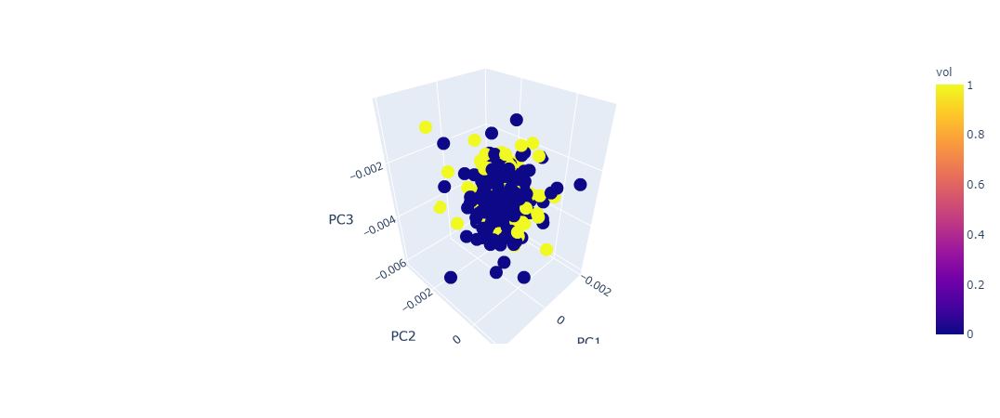

In [82]:
px.scatter_3d(df, x='PC1', y='PC2',z='PC3',hover_name='altdates',color='vol')

In [83]:
from scipy import spatial
1 - spatial.distance.cosine(df['sentence_vectors'][3], df['sentence_vectors'][190])

0.9245344572930092

In [84]:
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import cosine
dist_out = 1-pairwise_distances(sentence_vectors, metric="cosine")

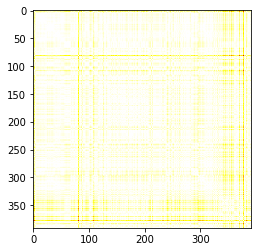

In [85]:
plt.imshow(dist_out, cmap='hot', interpolation='nearest')
plt.show()

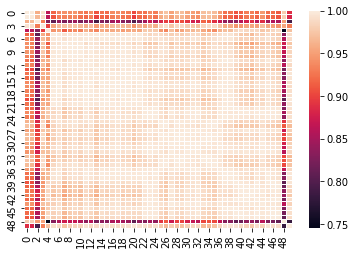

In [86]:
import seaborn as sns
import matplotlib.pylab as plt

#uniform_data = np.random.rand(10, 12)
ax = sns.heatmap(dist_out[0:50,0:50], linewidth=0.01)
plt.show()

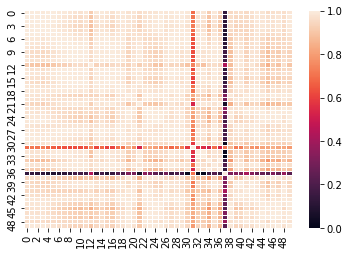

In [87]:
ax = sns.heatmap(dist_out[50:100,50:100], linewidth=0.01)
plt.show()

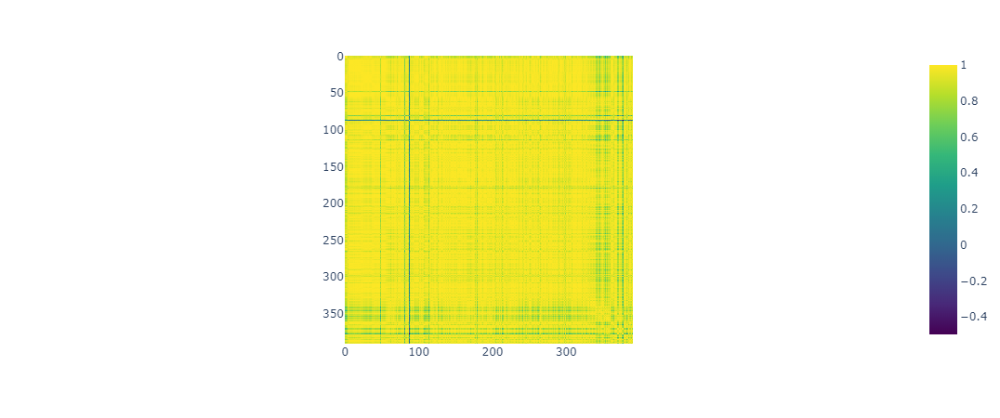

In [88]:
px.imshow(dist_out,color_continuous_scale='Viridis')

In [107]:
#march 3rd press release
ind = np.argpartition(dist_out[3], -10)[-10:]

In [108]:
ind

array([362, 258, 255, 110, 261, 241, 236, 206,   3,  95])

In [109]:
#speeches closest to march 3rd -- most during '08 crisis
df['altdates'][ind]

362    2001-12-11
258    2007-08-31
255    2007-10-19
110    2008-01-22
261    2007-03-02
241    2009-10-09
236    2010-10-11
206    2015-03-23
3      2020-03-16
95     2009-08-12
Name: altdates, dtype: object

In [94]:
#march 15th press release
ind = np.argpartition(dist_out[4], -6)[-6:]

In [95]:
ind

array([ 92, 224, 384, 338,   4, 151])

In [96]:
#speeches of speeches closest to march 15th
df['altdates'][ind]

92     2009-12-16
224    2013-02-22
384    1999-08-24
338    2004-12-14
4      2020-03-03
151    2019-06-05
Name: altdates, dtype: object

In [112]:
df['content'][92]

'Information received since the Federal Open Market Committee met in November suggests that economic activity has continued to pick up and that the deterioration in the labor market is abating. The housing sector has shown some signs of improvement over recent months. Household spending appears to be expanding at a moderate rate, though it remains constrained by a weak labor market, modest income growth, lower housing wealth, and tight credit. Businesses are still cutting back on fixed investment, though at a slower pace, and remain reluctant to add to payrolls; they continue to make progress in bringing inventory stocks into better alignment with sales. Financial market conditions have become more supportive of economic growth. Although economic activity is likely to remain weak for a time, the Committee anticipates that policy actions to stabilize financial markets and institutions, fiscal and monetary stimulus, and market forces will contribute to a strengthening of economic growth 

#### Other Deep Models Used

In [32]:
deep_model = models.Sequential()
deep_model.add(layers.Embedding(15001, 8))
deep_model.add(layers.SimpleRNN(8,dropout=0.3, recurrent_dropout=0.3,kernel_regularizer=regularizers.l2(0.1),return_sequences=True))
#deep_model.add(layers.Embedding(15001, 8))
deep_model.add(layers.SimpleRNN(8,dropout=0.3, recurrent_dropout=0.3,kernel_regularizer=regularizers.l2(0.1)))
deep_model.add(layers.Dense(1, activation='sigmoid'))

In [33]:
deep_model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, None, 8)           120008    
_________________________________________________________________
simple_rnn (SimpleRNN)       (None, None, 8)           136       
_________________________________________________________________
simple_rnn_1 (SimpleRNN)     (None, 8)                 136       
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 9         
Total params: 120,289
Trainable params: 120,289
Non-trainable params: 0
_________________________________________________________________


In [34]:
deep_model.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['accuracy'])

In [36]:
deep_history = deep_model.fit(padded, train_labels, epochs=num_epochs, validation_data=(testing_padded, test_labels))

Epoch 1/15
99/99 [==============================] - 5s 53ms/step - loss: 2.1572 - accuracy: 0.6247 - val_loss: 1.6747 - val_accuracy: 0.9163
Epoch 2/15
99/99 [==============================] - 4s 45ms/step - loss: 1.4525 - accuracy: 0.8564 - val_loss: 1.0825 - val_accuracy: 0.9163
Epoch 3/15
99/99 [==============================] - 4s 45ms/step - loss: 0.9125 - accuracy: 0.9100 - val_loss: 0.6959 - val_accuracy: 0.9163
Epoch 4/15
99/99 [==============================] - 4s 45ms/step - loss: 0.5767 - accuracy: 0.9132 - val_loss: 0.4553 - val_accuracy: 0.9163
Epoch 5/15
99/99 [==============================] - 4s 45ms/step - loss: 0.3996 - accuracy: 0.9132 - val_loss: 0.3319 - val_accuracy: 0.9163
Epoch 6/15
99/99 [==============================] - 4s 44ms/step - loss: 0.3191 - accuracy: 0.9132 - val_loss: 0.2932 - val_accuracy: 0.9163
Epoch 7/15
99/99 [==============================] - 4s 45ms/step - loss: 0.3018 - accuracy: 0.9132 - val_loss: 0.2882 - val_accuracy: 0.9163
Epoch 8/15
99

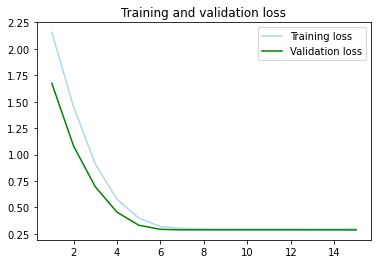

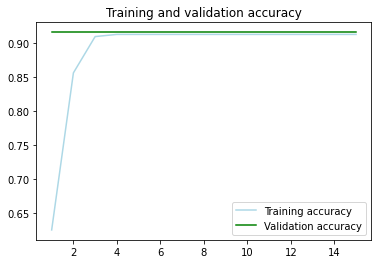

In [38]:
accuracy = deep_history.history['accuracy']
val_accuracy = deep_history.history['val_accuracy']
loss = deep_history.history['loss']
val_loss = deep_history.history['val_loss']

epochs = range(1, len(accuracy) + 1)

plt.plot(epochs, loss, 'lightblue', label='Training loss')
plt.plot(epochs, val_loss, 'green', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.figure()

plt.plot(epochs, accuracy, 'lightblue', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'green', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.show()

In [45]:
e = deep_model.layers[0]
weights = e.get_weights()[0]
print(weights.shape) # shape: (vocab_size, embedding_dim)

(15001, 8)


In [46]:
import io

out_v = io.open('deep_vecs.tsv', 'w', encoding='utf-8')
out_m = io.open('deep_meta.tsv', 'w', encoding='utf-8')
out_m.write("Words" + "\n")
#out_v.write("Word Embeddings" + "\n")
for word_num in range(1, vocab_size):
    word = reverse_word_index[word_num]
    embeddings = weights[word_num]
    out_m.write(word + "\n")
    out_v.write('\t'.join([str(x) for x in embeddings]) + "\n")
out_v.close()
out_m.close()

#### LSTM Model

In [39]:
model_lstm = models.Sequential()
model_lstm.add(layers.Embedding(15001, 8))
model_lstm.add(layers.LSTM(8,dropout=0.3, recurrent_dropout=0.3,kernel_regularizer=regularizers.l2(0.1)))
model_lstm.add(layers.Dense(1, activation='sigmoid'))

In [40]:
model_lstm.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_2 (Embedding)      (None, None, 8)           120008    
_________________________________________________________________
lstm (LSTM)                  (None, 8)                 544       
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 9         
Total params: 120,561
Trainable params: 120,561
Non-trainable params: 0
_________________________________________________________________


In [41]:
model_lstm.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['accuracy'])

In [42]:
lstm_history = model_lstm.fit(padded, train_labels, epochs=num_epochs, validation_data=(testing_padded, test_labels))

Epoch 1/15
99/99 [==============================] - 7s 72ms/step - loss: 1.2621 - accuracy: 0.9097 - val_loss: 0.8064 - val_accuracy: 0.9163
Epoch 2/15
99/99 [==============================] - 7s 72ms/step - loss: 0.6036 - accuracy: 0.9132 - val_loss: 0.4341 - val_accuracy: 0.9163
Epoch 3/15
99/99 [==============================] - 7s 72ms/step - loss: 0.3657 - accuracy: 0.9132 - val_loss: 0.3068 - val_accuracy: 0.9163
Epoch 4/15
99/99 [==============================] - 7s 72ms/step - loss: 0.3014 - accuracy: 0.9132 - val_loss: 0.2877 - val_accuracy: 0.9163
Epoch 5/15
99/99 [==============================] - 7s 72ms/step - loss: 0.2965 - accuracy: 0.9132 - val_loss: 0.2876 - val_accuracy: 0.9163
Epoch 6/15
99/99 [==============================] - 7s 67ms/step - loss: 0.2966 - accuracy: 0.9132 - val_loss: 0.2876 - val_accuracy: 0.9163
Epoch 7/15
99/99 [==============================] - 7s 67ms/step - loss: 0.2955 - accuracy: 0.9132 - val_loss: 0.2876 - val_accuracy: 0.9163
Epoch 8/15
99

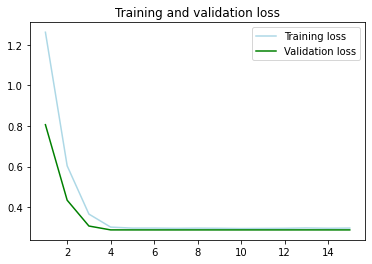

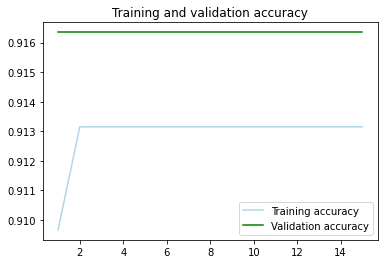

In [43]:
accuracy = lstm_history.history['accuracy']
val_accuracy = lstm_history.history['val_accuracy']
loss = lstm_history.history['loss']
val_loss = lstm_history.history['val_loss']

epochs = range(1, len(accuracy) + 1)

plt.plot(epochs, loss, 'lightblue', label='Training loss')
plt.plot(epochs, val_loss, 'green', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.figure()

plt.plot(epochs, accuracy, 'lightblue', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'green', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.show()